# Tutorials for Vision Transformer Interpretability

## requirment

In [1]:
%env CUDA_VISIBLE_DEVICES=0

env: CUDA_VISIBLE_DEVICES=0


In [2]:
from PIL import Image
import torchvision.transforms as transforms
import torch.nn.functional as F
import matplotlib.pyplot as plt
import torch
import numpy as np
import cv2
from tqdm import tqdm

from samples.CLS2IDX import CLS2IDX

In [3]:
normalize = transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
transform = transforms.Compose([
    transforms.Resize(size=(224, 224)),
    transforms.ToTensor(),
    normalize,
])

# create heatmap from mask on image
def show_cam_on_image(img, mask):
    heatmap = cv2.applyColorMap(np.uint8(255 * mask), cv2.COLORMAP_JET)
    heatmap = np.float32(heatmap) / 255
    cam = 0.6 * heatmap + 0.4 * np.float32(img)
    cam = cam / np.max(cam)
    return cam


def print_top_classes(predictions, **kwargs):    
    # Print Top-5 predictions
    prob = torch.softmax(predictions, dim=1)
    class_indices = predictions.data.topk(5, dim=1)[1][0].tolist()
    max_str_len = 0
    class_names = []
    for cls_idx in class_indices:
        class_names.append(CLS2IDX[cls_idx])
        if len(CLS2IDX[cls_idx]) > max_str_len:
            max_str_len = len(CLS2IDX[cls_idx])
    
    print('Top 5 classes:')
    for cls_idx in class_indices:
        output_string = '\t{} : {}'.format(cls_idx, CLS2IDX[cls_idx])
        output_string += ' ' * (max_str_len - len(CLS2IDX[cls_idx])) + '\t\t'
        output_string += 'value = {:.3f}\t prob = {:.1f}%'.format(predictions[0, cls_idx], 100 * prob[0, cls_idx])
        print(output_string)

# heatmap
def heatmap_overlap(img, attribution):
    mask = torch.nn.functional.interpolate(attribution.reshape(1, 1, attribution.shape[0], attribution.shape[1]), scale_factor=16, mode='bilinear')
    mask = mask.squeeze()
    mask = mask.cpu().detach().numpy()
    mask = (mask - mask.min()) / (mask.max() - mask.min())
    im = img.permute(1, 2, 0).data.cpu().numpy()
    im = (im - im.min()) / (im.max() - im.min())
    vis = show_cam_on_image(im, mask)
    vis =  np.uint8(255 * vis)
    vis = cv2.cvtColor(np.array(vis), cv2.COLOR_RGB2BGR)
    return vis

## load model

In [5]:
from baselines.ViT.ViT_new import vit_base_patch16_224

# Model
model = vit_base_patch16_224(pretrained=True).cuda()
model = model.eval()


from baselines.ViT.ViT_LRP import vit_base_patch16_224 as vit_LRP

# Model
model_lrp = vit_LRP(pretrained=True).cuda()
model_lrp = model_lrp.eval()

## Transition Attention Maps

<left>
<img src="./images/pipeline.jpg", width="60%"/>

## load interpretabel methods

In [6]:
from baselines.ViT.interpret_methods import InterpretTransformer

it = InterpretTransformer(model)

it_lrp = InterpretTransformer(model_lrp)

## methods comparison

### multi-classes

Top 5 classes:
	161 : basset, basset hound         		value = 11.002	 prob = 92.3%
	163 : bloodhound, sleuthhound      		value = 7.506	 prob = 2.8%
	166 : Walker hound, Walker foxhound		value = 6.755	 prob = 1.3%
	162 : beagle                       		value = 5.355	 prob = 0.3%
	168 : redbone                      		value = 4.739	 prob = 0.2%
cls1 label:  161
cls2 label:  87


/opt/conda/envs/pytorch/lib/python3.7/site-packages/torch/nn/functional.py:3063: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


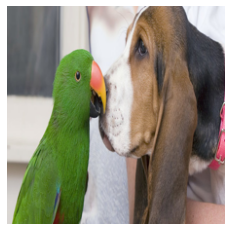

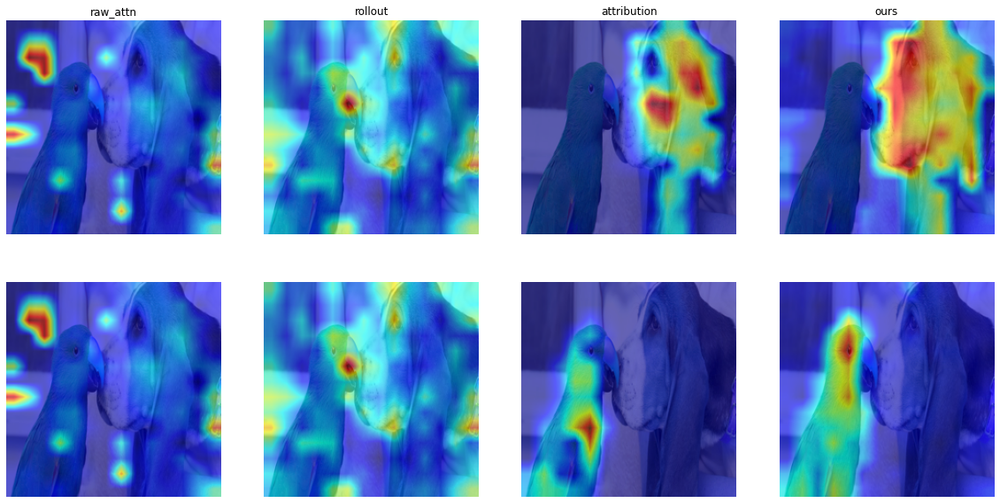

Top 5 classes:
	207 : golden retriever  		value = 9.716	 prob = 66.7%
	285 : Egyptian cat      		value = 7.722	 prob = 9.1%
	208 : Labrador retriever		value = 7.636	 prob = 8.3%
	281 : tabby, tabby cat  		value = 6.470	 prob = 2.6%
	222 : kuvasz            		value = 6.249	 prob = 2.1%
cls1 label:  207
cls2 label:  285


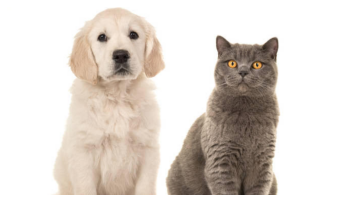

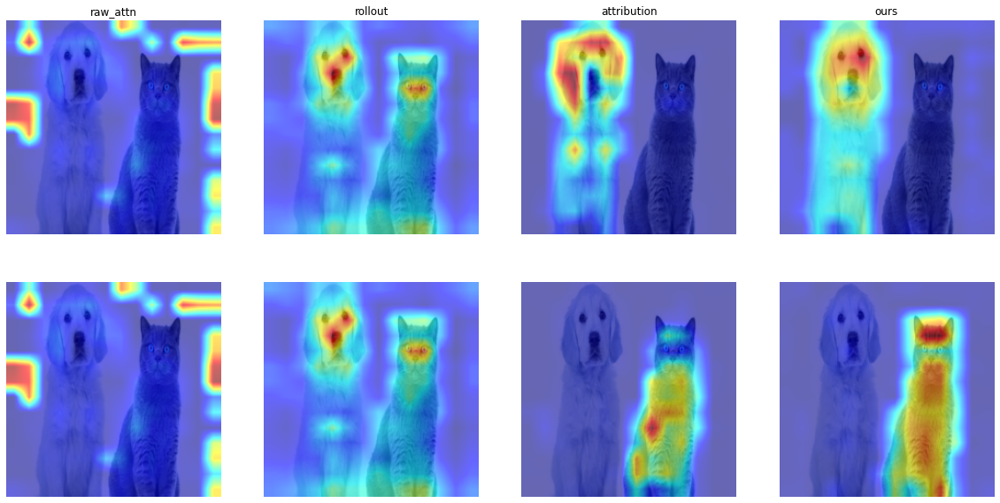

Top 5 classes:
	282 : tiger cat                                                                                         		value = 9.666	 prob = 63.6%
	281 : tabby, tabby cat                                                                                  		value = 8.202	 prob = 14.7%
	243 : bull mastiff                                                                                      		value = 7.585	 prob = 7.9%
	285 : Egyptian cat                                                                                      		value = 6.672	 prob = 3.2%
	180 : American Staffordshire terrier, Staffordshire terrier, American pit bull terrier, pit bull terrier		value = 5.280	 prob = 0.8%
cls1 label:  282
cls2 label:  243


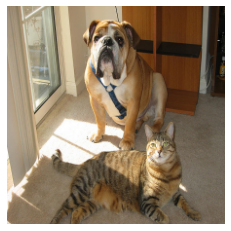

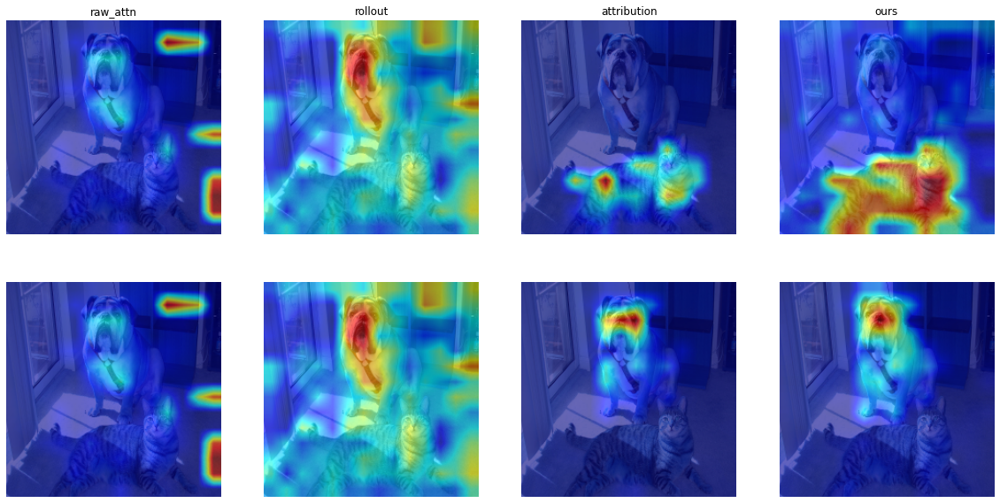

Top 5 classes:
	340 : zebra                               		value = 12.175	 prob = 91.4%
	386 : African elephant, Loxodonta africana		value = 9.131	 prob = 4.4%
	101 : tusker                              		value = 8.193	 prob = 1.7%
	9 : ostrich, Struthio camelus           		value = 6.874	 prob = 0.5%
	385 : Indian elephant, Elephas maximus    		value = 6.338	 prob = 0.3%
cls1 label:  340
cls2 label:  386


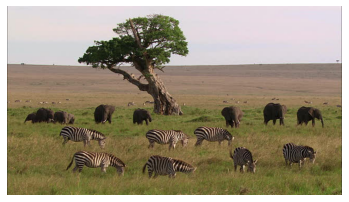

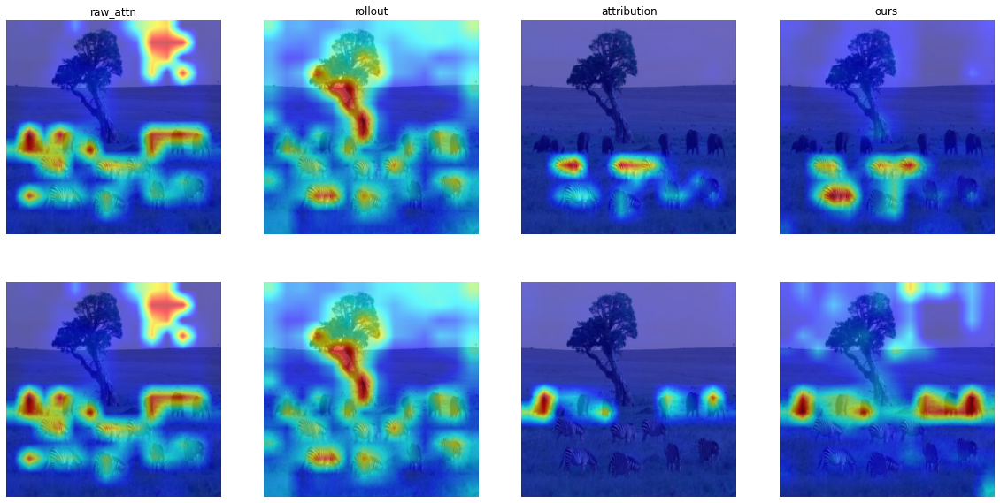

Top 5 classes:
	386 : African elephant, Loxodonta africana		value = 11.112	 prob = 33.9%
	340 : zebra                               		value = 11.102	 prob = 33.5%
	101 : tusker                              		value = 10.777	 prob = 24.2%
	385 : Indian elephant, Elephas maximus    		value = 9.521	 prob = 6.9%
	343 : warthog                             		value = 5.704	 prob = 0.2%
cls1 label:  386
cls2 label:  340


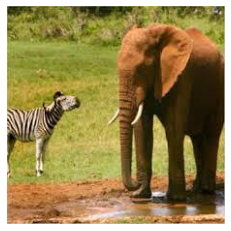

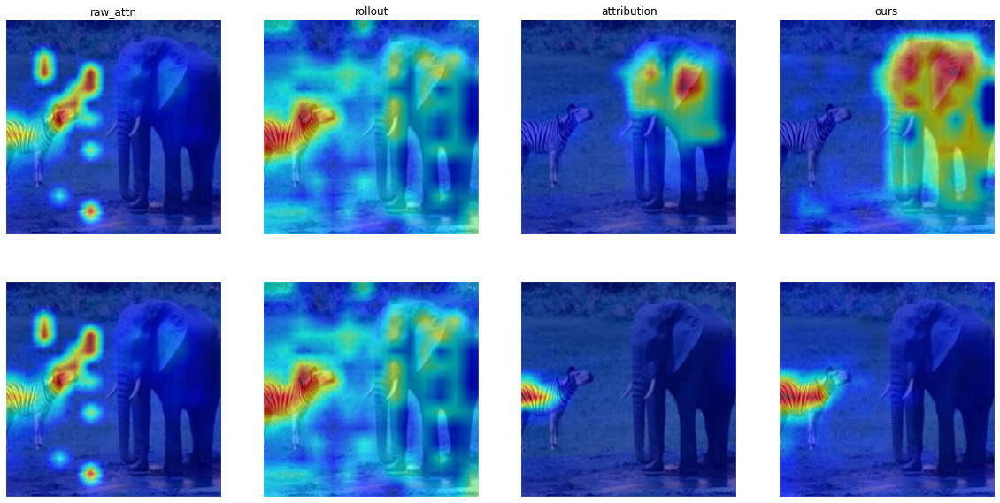

Top 5 classes:
	340 : zebra                               		value = 12.099	 prob = 81.0%
	386 : African elephant, Loxodonta africana		value = 10.008	 prob = 10.0%
	385 : Indian elephant, Elephas maximus    		value = 9.246	 prob = 4.7%
	101 : tusker                              		value = 8.870	 prob = 3.2%
	343 : warthog                             		value = 5.197	 prob = 0.1%
cls1 label:  340
cls2 label:  386


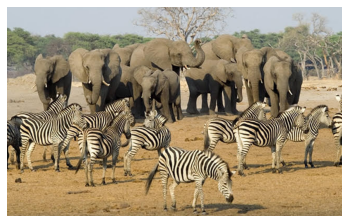

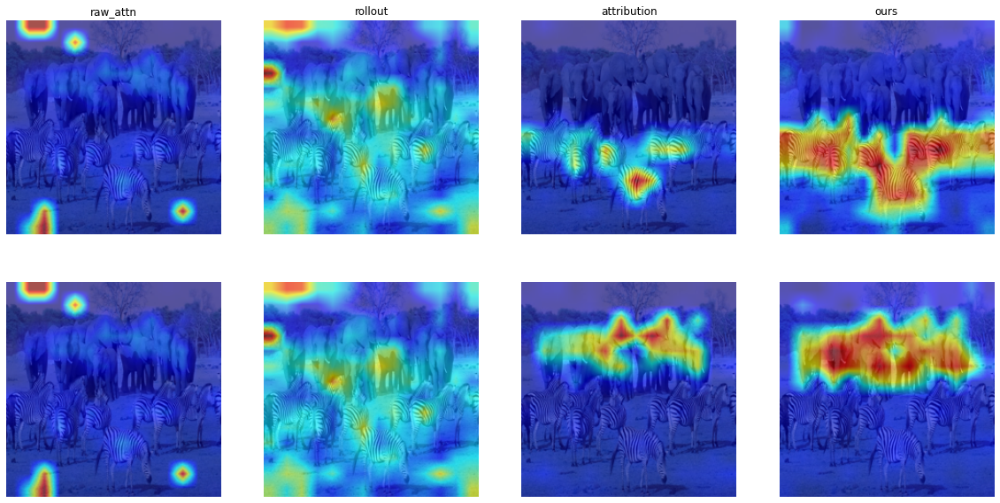

Top 5 classes:
	340 : zebra                                                    		value = 11.552	 prob = 66.9%
	101 : tusker                                                   		value = 10.295	 prob = 19.0%
	386 : African elephant, Loxodonta africana                     		value = 9.175	 prob = 6.2%
	385 : Indian elephant, Elephas maximus                         		value = 9.098	 prob = 5.7%
	346 : water buffalo, water ox, Asiatic buffalo, Bubalus bubalis		value = 5.889	 prob = 0.2%
cls1 label:  340
cls2 label:  386


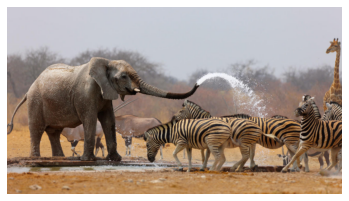

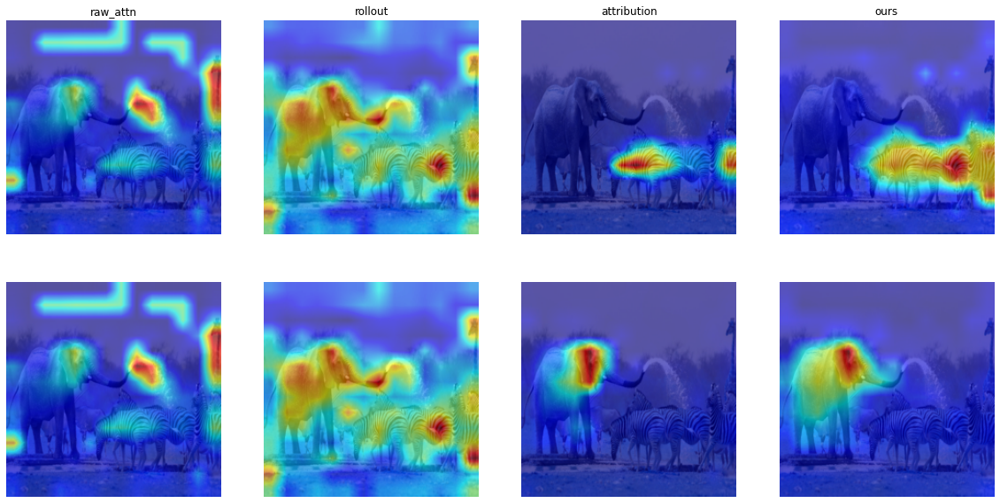

Top 5 classes:
	101 : tusker                              		value = 11.202	 prob = 36.0%
	386 : African elephant, Loxodonta africana		value = 10.923	 prob = 27.2%
	340 : zebra                               		value = 10.896	 prob = 26.5%
	385 : Indian elephant, Elephas maximus    		value = 9.836	 prob = 9.2%
	343 : warthog                             		value = 4.884	 prob = 0.1%
cls1 label:  101
cls2 label:  340


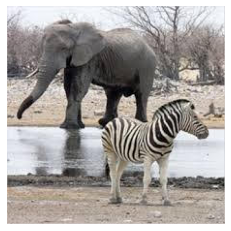

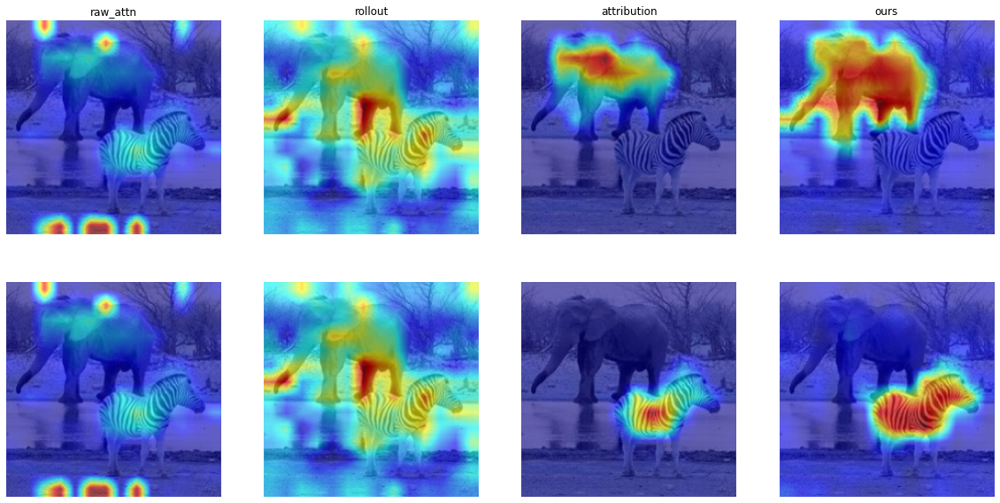

In [7]:
import glob
import os

n_methods = 4

root_path = os.getcwd()
for img_path in glob.glob(os.path.join(root_path, 'samples', '*.png')):
    img_name = os.path.basename(img_path).replace('.png', '')
    image = Image.open(img_path)
    data = transform(image)
    
    output = model(data.unsqueeze(0).cuda())
    print_top_classes(output)
    
    plt.imshow(image)
    plt.axis('off')
    
    index = np.argmax(output.cpu().data.numpy(), axis=-1)[0]
    class_index = 0
    if index == 243:
        class_index = 282
    elif index == 386 or index == 101:
        class_index = 340
    elif index == 340:
        class_index = 386
    elif index == 282:
        class_index = 243
    elif index == 285:
        class_index = 207
    elif index == 207:
        class_index = 285
    elif index == 161:
        class_index = 87
        
    print("cls1 label: ", index)
    print("cls2 label: ", class_index)
    
    plt.figure(figsize=(n_methods*5, 10))
    
    pred = it.raw_attn(data.unsqueeze(0).cuda())
    vis = heatmap_overlap(data, pred.reshape(14, 14).cpu().detach())
    plt.subplot(2, n_methods, 1)
    plt.title('raw_attn')
    plt.imshow(vis)
    plt.axis('off')
    
    target = it.raw_attn(data.unsqueeze(0).cuda(), index=class_index)
    vis = heatmap_overlap(data, target.reshape(14, 14).cpu().detach())
    plt.subplot(2, n_methods, 1 + n_methods)
    plt.title('')
    plt.imshow(vis)
    plt.axis('off')
    
    pred = it.rollout(data.unsqueeze(0).cuda(), start_layer=0)
    vis = heatmap_overlap(data, pred.reshape(14, 14).cpu().detach())
    plt.subplot(2, n_methods, 2)
    plt.title('rollout')
    plt.imshow(vis)
    plt.axis('off')
    
    target = it.rollout(data.unsqueeze(0).cuda(), index=class_index, start_layer=0)
    vis = heatmap_overlap(data, target.reshape(14, 14).cpu().detach())
    plt.subplot(2, n_methods, 2 + n_methods)
    plt.title('')
    plt.imshow(vis)
    plt.axis('off')
    
    pred = it_lrp.attribution(data.unsqueeze(0).cuda())
    vis = heatmap_overlap(data, pred.reshape(14, 14).cpu().detach()) 
    plt.subplot(2, n_methods, 3)
    plt.title('attribution')
    plt.imshow(vis)
    plt.axis('off')
    
    target = it_lrp.attribution(data.unsqueeze(0).cuda(), index=class_index)
    vis = heatmap_overlap(data, target.reshape(14, 14).cpu().detach()) 
    plt.subplot(2, n_methods, 3 + n_methods)
    plt.title('')
    plt.imshow(vis)
    plt.axis('off')
    
    pred = it.transition_attention_maps(data.unsqueeze(0).cuda(), start_layer=0, steps=20)
    vis = heatmap_overlap(data, pred.reshape(14, 14).cpu().detach())
    plt.subplot(2, n_methods, 4)
    plt.title('ours')
    plt.imshow(vis)
    plt.axis('off')
    
    target = it.transition_attention_maps(data.unsqueeze(0).cuda(), index=class_index, start_layer=4, steps=20)
    vis = heatmap_overlap(data, target.reshape(14, 14).cpu().detach()) 
    plt.subplot(2, n_methods, 4 + n_methods)
    plt.title('')
    plt.imshow(vis)
    plt.axis('off')
        
    plt.show()

### single class

Top 5 classes:
	629 : lipstick, lip rouge		value = 14.565	 prob = 99.6%
	551 : face powder        		value = 8.622	 prob = 0.3%
	585 : hair spray         		value = 6.560	 prob = 0.0%
	711 : perfume, essence   		value = 6.415	 prob = 0.0%
	631 : lotion             		value = 5.184	 prob = 0.0%


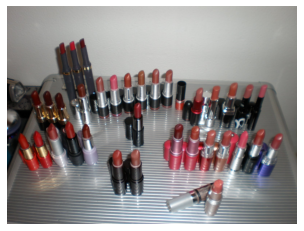

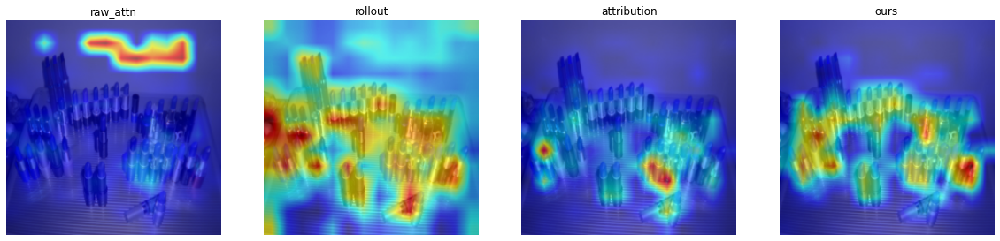

Top 5 classes:
	993 : gyromitra                                                                		value = 14.956	 prob = 99.8%
	996 : hen-of-the-woods, hen of the woods, Polyporus frondosus, Grifola frondosa		value = 8.426	 prob = 0.1%
	995 : earthstar                                                                		value = 6.098	 prob = 0.0%
	994 : stinkhorn, carrion fungus                                                		value = 5.116	 prob = 0.0%
	991 : coral fungus                                                             		value = 5.064	 prob = 0.0%


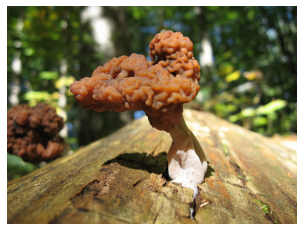

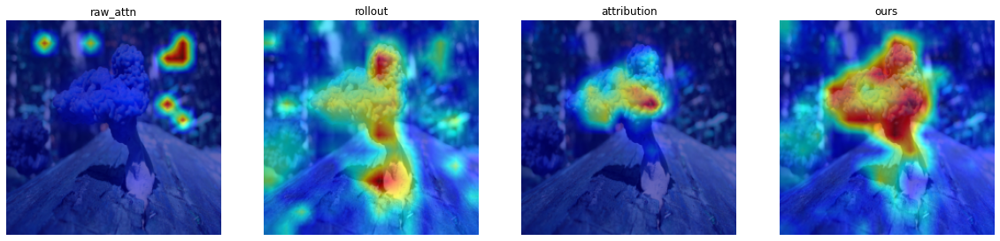

Top 5 classes:
	292 : tiger, Panthera tigris                    		value = 13.987	 prob = 97.4%
	282 : tiger cat                                 		value = 10.222	 prob = 2.3%
	290 : jaguar, panther, Panthera onca, Felis onca		value = 6.703	 prob = 0.1%
	288 : leopard, Panthera pardus                  		value = 6.592	 prob = 0.1%
	289 : snow leopard, ounce, Panthera uncia       		value = 6.006	 prob = 0.0%


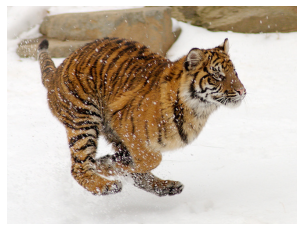

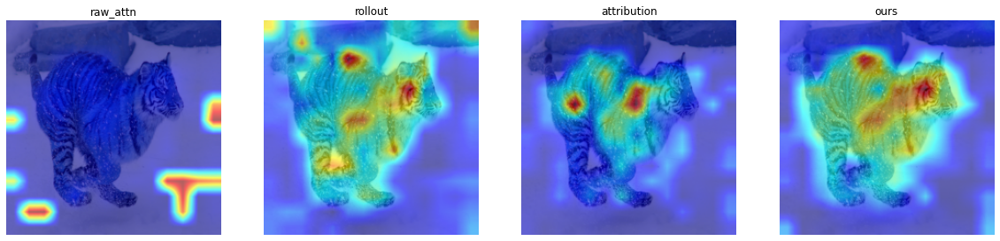

Top 5 classes:
	270 : white wolf, Arctic wolf, Canis lupus tundrarum 		value = 13.543	 prob = 97.3%
	269 : timber wolf, grey wolf, gray wolf, Canis lupus 		value = 9.398	 prob = 1.5%
	271 : red wolf, maned wolf, Canis rufus, Canis niger 		value = 7.429	 prob = 0.2%
	273 : dingo, warrigal, warragal, Canis dingo         		value = 7.258	 prob = 0.2%
	272 : coyote, prairie wolf, brush wolf, Canis latrans		value = 7.070	 prob = 0.2%


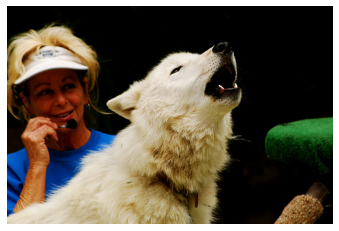

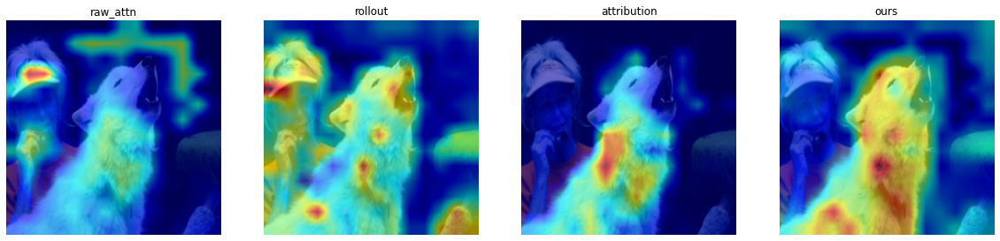

Top 5 classes:
	21 : kite                                                		value = 13.914	 prob = 99.8%
	80 : black grouse                                        		value = 4.670	 prob = 0.0%
	81 : ptarmigan                                           		value = 4.342	 prob = 0.0%
	22 : bald eagle, American eagle, Haliaeetus leucocephalus		value = 4.074	 prob = 0.0%
	23 : vulture                                             		value = 3.608	 prob = 0.0%


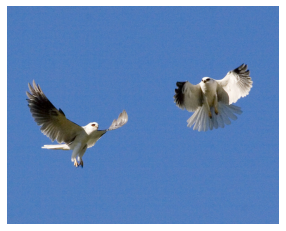

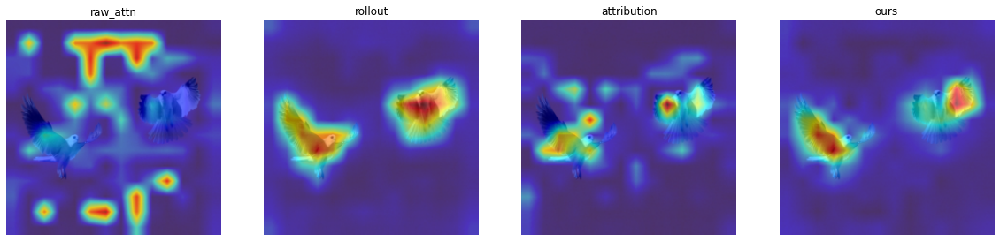

Top 5 classes:
	99 : goose                                  		value = 13.307	 prob = 97.9%
	98 : red-breasted merganser, Mergus serrator		value = 8.998	 prob = 1.3%
	97 : drake                                  		value = 6.906	 prob = 0.2%
	128 : black stork, Ciconia nigra             		value = 6.356	 prob = 0.1%
	21 : kite                                   		value = 5.575	 prob = 0.0%


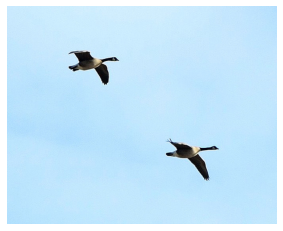

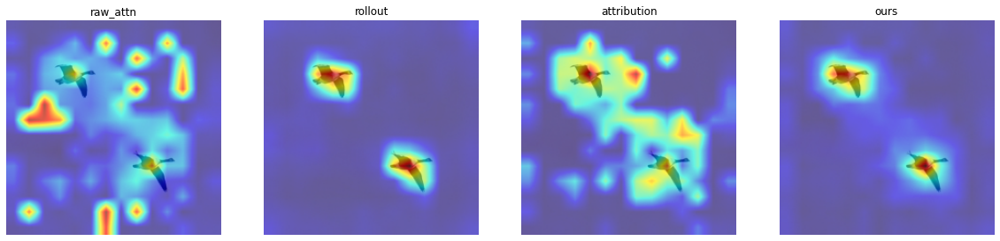

Top 5 classes:
	18 : magpie                                 		value = 13.494	 prob = 99.1%
	128 : black stork, Ciconia nigra             		value = 6.846	 prob = 0.1%
	136 : European gallinule, Porphyrio porphyrio		value = 6.566	 prob = 0.1%
	80 : black grouse                           		value = 6.455	 prob = 0.1%
	143 : oystercatcher, oyster catcher          		value = 6.173	 prob = 0.1%


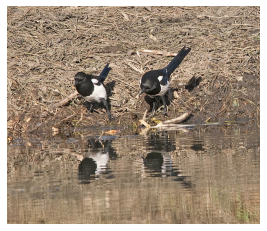

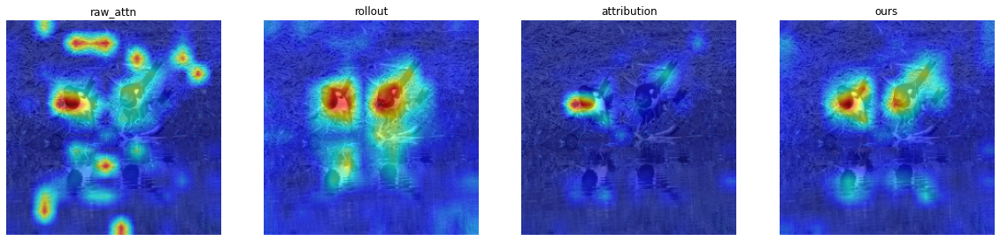

Top 5 classes:
	232 : Border collie                 		value = 10.362	 prob = 68.0%
	231 : collie                        		value = 8.262	 prob = 8.3%
	256 : Newfoundland, Newfoundland dog		value = 7.446	 prob = 3.7%
	220 : Sussex spaniel                		value = 6.681	 prob = 1.7%
	152 : Japanese spaniel              		value = 6.245	 prob = 1.1%


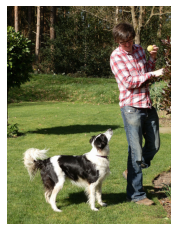

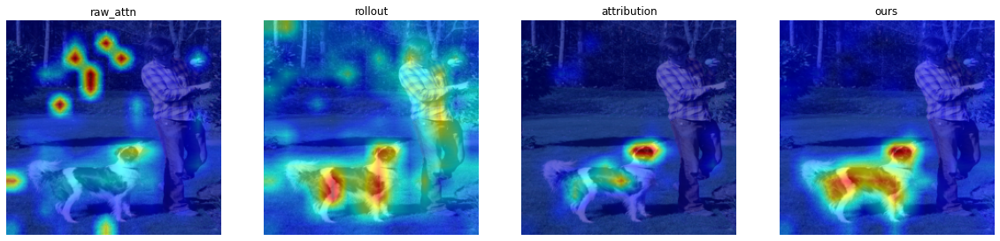

Top 5 classes:
	146 : albatross, mollymawk                		value = 14.091	 prob = 99.9%
	77 : wolf spider, hunting spider         		value = 3.012	 prob = 0.0%
	649 : megalith, megalithic structure      		value = 2.775	 prob = 0.0%
	754 : radio, wireless                     		value = 2.589	 prob = 0.0%
	145 : king penguin, Aptenodytes patagonica		value = 2.372	 prob = 0.0%


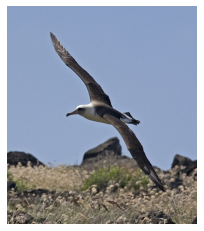

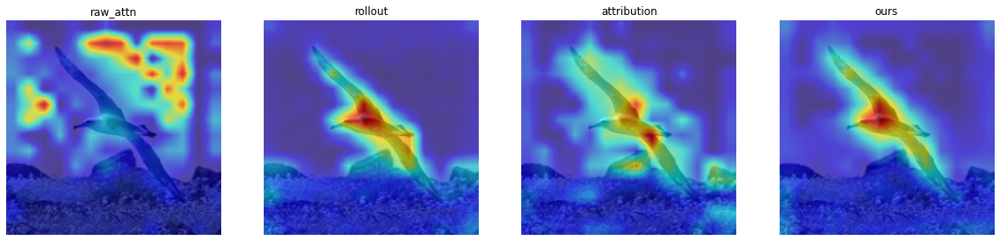

In [8]:
import glob
import os

n_methods = 4

root_path = os.getcwd()
for img_path in glob.glob(os.path.join(root_path, 'samples', '*.jpeg')):
    image = Image.open(img_path)
    data = transform(image)
    
    output = model(data.unsqueeze(0).cuda())
    print_top_classes(output)
    
    plt.imshow(image)
    plt.axis('off')
    
    plt.figure(figsize=(n_methods*5, 10))
    
    pred = it.raw_attn(data.unsqueeze(0).cuda())
    vis = heatmap_overlap(data, pred.reshape(14, 14).cpu().detach())
    plt.subplot(1, n_methods, 1)
    plt.title('raw_attn')
    plt.imshow(vis)
    plt.axis('off')
    
    pred = it.rollout(data.unsqueeze(0).cuda(), start_layer=0)
    vis = heatmap_overlap(data, pred.reshape(14, 14).cpu().detach())
    plt.subplot(1, n_methods, 2)
    plt.title('rollout')
    plt.imshow(vis)
    plt.axis('off')

    
    pred = it_lrp.attribution(data.unsqueeze(0).cuda())
    vis = heatmap_overlap(data, pred.reshape(14, 14).cpu().detach()) 
    plt.subplot(1, n_methods, 3)
    plt.title('attribution')
    plt.imshow(vis)
    plt.axis('off')
    
    pred = it.transition_attention_maps(data.unsqueeze(0).cuda(), start_layer=0, steps=20)
    vis = heatmap_overlap(data, pred.reshape(14, 14).cpu().detach())
    plt.subplot(1, n_methods, 4)
    plt.title('ours')
    plt.imshow(vis)
    plt.axis('off')
    
        
    plt.show()